In [6]:
#importing libraries
import pandas as pd
import numpy as np

import seaborn as sns

import matplotlib
import matplotlib.pyplot as plt
plt.style.use('ggplot')
from matplotlib.pyplot import figure
%matplotlib inline


In [7]:
#read the dataset
path = r"C:\Users\Olasunkanmi Dara\Downloads\movies.csv"

movies = pd.read_csv(path)

<h2 align="center">Data Wrangling</h2>

In [8]:
#preview dataa
movies.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


In [9]:
#checking info and data type
movies.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7668 entries, 0 to 7667
Data columns (total 15 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   name      7668 non-null   object 
 1   rating    7591 non-null   object 
 2   genre     7668 non-null   object 
 3   year      7668 non-null   int64  
 4   released  7666 non-null   object 
 5   score     7665 non-null   float64
 6   votes     7665 non-null   float64
 7   director  7668 non-null   object 
 8   writer    7665 non-null   object 
 9   star      7667 non-null   object 
 10  country   7665 non-null   object 
 11  budget    5497 non-null   float64
 12  gross     7479 non-null   float64
 13  company   7651 non-null   object 
 14  runtime   7664 non-null   float64
dtypes: float64(5), int64(1), object(9)
memory usage: 898.7+ KB


In [87]:
movies.shape

(5421, 16)

In [10]:
#checking for missing data
movies.isnull().sum()

name           0
rating        77
genre          0
year           0
released       2
score          3
votes          3
director       0
writer         3
star           1
country        3
budget      2171
gross        189
company       17
runtime        4
dtype: int64

In [15]:
#checking the missing values in percentage

for col in movies.columns:
    pcm = np.mean(movies[col].isnull())
    print('{} - {}%'.format(col, pcm))

name - 0.0%
rating - 0.010041731872717789%
genre - 0.0%
year - 0.0%
released - 0.0002608242044861763%
score - 0.0003912363067292645%
votes - 0.0003912363067292645%
director - 0.0%
writer - 0.0003912363067292645%
star - 0.00013041210224308815%
country - 0.0003912363067292645%
budget - 0.2831246739697444%
gross - 0.02464788732394366%
company - 0.002217005738132499%
runtime - 0.0005216484089723526%


In [16]:
#rremoving nulls 
movies = movies.dropna()

In [17]:
#checking for missing data
movies.isnull().sum()

name        0
rating      0
genre       0
year        0
released    0
score       0
votes       0
director    0
writer      0
star        0
country     0
budget      0
gross       0
company     0
runtime     0
dtype: int64

In [86]:
movies.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5421 entries, 7445 to 3318
Data columns (total 16 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   name         5421 non-null   object        
 1   rating       5421 non-null   object        
 2   genre        5421 non-null   object        
 3   year         5421 non-null   int64         
 4   released     5421 non-null   datetime64[ns]
 5   score        5421 non-null   float64       
 6   votes        5421 non-null   float64       
 7   director     5421 non-null   object        
 8   writer       5421 non-null   object        
 9   star         5421 non-null   object        
 10  country      5421 non-null   object        
 11  budget       5421 non-null   int64         
 12  gross        5421 non-null   int64         
 13  company      5421 non-null   object        
 14  runtime      5421 non-null   float64       
 15  correctyear  5421 non-null   object        
dtypes: 

In [154]:
movies.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,correctyear
5445,386,5,0,2009,2009-12-18,7.8,1100000.0,785,1263,1534,47,237000000,2847246203,1382,162.0,29
7445,388,5,0,2019,2019-04-26,8.4,903000.0,105,513,1470,47,356000000,2797501328,983,181.0,39
3045,4909,5,6,1997,1997-12-19,7.8,1100000.0,785,1263,1073,47,200000000,2201647264,1382,194.0,17
6663,3643,5,0,2015,2015-12-18,7.8,876000.0,768,1806,356,47,245000000,2069521700,945,138.0,35
7244,389,5,0,2018,2018-04-27,8.4,897000.0,105,513,1470,47,321000000,2048359754,983,149.0,38


In [20]:
#change budget and gross columns datatype
movies['budget'] = movies['budget'].astype('int64')
movies['gross'] = movies['gross'].astype('int64')

When checking the dataset, the released and year are not corresponding. we are going to be extracting the year from the released column to get the act year the movie get released and drop the year column that was given

In [56]:
#adjust relased column
#convert released colum to str
movies['released'] = movies['released'].astype('str')

In [57]:
from datetime import datetime

# extract the date part of the string
movies['released'] = movies['released'].str.split('(', expand=True)[0]

# convert the date column to datetime format
movies['released'] = pd.to_datetime(movies['released'])

# extract the year and convert it to string
movies['correctedyear'] = movies['released'].dt.strftime('%Y')

#converting to string b4 joining 



In [81]:
#rename a column
movies = movies.rename(columns={'correctedyear': 'correctyear'})

#preview
movies.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,correctyear
5445,Avatar,PG-13,Action,2009,2009-12-18,7.8,1100000.0,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162.0,2009
7445,Avengers: Endgame,PG-13,Action,2019,2019-04-26,8.4,903000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181.0,2019
3045,Titanic,PG-13,Drama,1997,1997-12-19,7.8,1100000.0,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194.0,1997
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,2015-12-18,7.8,876000.0,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138.0,2015
7244,Avengers: Infinity War,PG-13,Action,2018,2018-04-27,8.4,897000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.0,2018


In [92]:
#sorting by gross in descending order
movies = movies.sort_values(by=['gross'], inplace=False, ascending=False)

In [74]:
#displaying data in full
pd.set_option('display.max_rows', None)

In [69]:
#checking for and droppping duplicate
movies.duplicated().sum()

0

There are no duplicates in the dataset

### Data correlation

##### We want to check for 2 correlation:
##### - Corrrelation betweeen gross and budget (whether it is high or low)
#### -Correlation between company and gross(if the company that made the film influences the gross)

### Correlation between gross and budget:

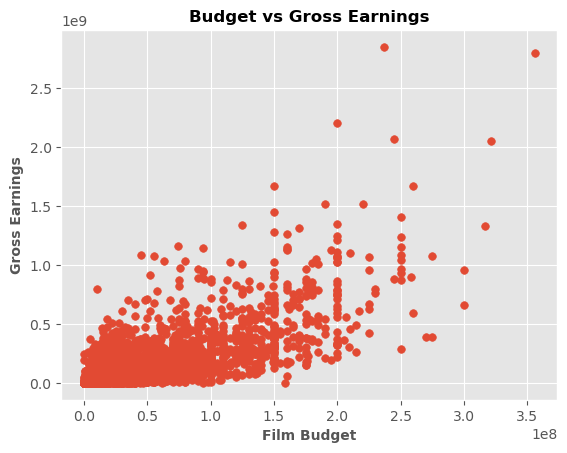

In [114]:
# create a scatter plot of budget vs gross
plt.scatter(x=movies['budget'], y=movies['gross'], s=30)

plt.xlabel('Film Budget',  fontsize = 10, weight = 'bold')
plt.ylabel('Gross Earnings',  fontsize = 10, weight = 'bold')
plt.title('Budget vs Gross Earnings', fontsize = 12, weight = 'bold')

# display the plot
plt.show()

In [93]:
movies.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,correctyear
5445,Avatar,PG-13,Action,2009,2009-12-18,7.8,1100000.0,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162.0,2009
7445,Avengers: Endgame,PG-13,Action,2019,2019-04-26,8.4,903000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181.0,2019
3045,Titanic,PG-13,Drama,1997,1997-12-19,7.8,1100000.0,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194.0,1997
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,2015-12-18,7.8,876000.0,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138.0,2015
7244,Avengers: Infinity War,PG-13,Action,2018,2018-04-27,8.4,897000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.0,2018


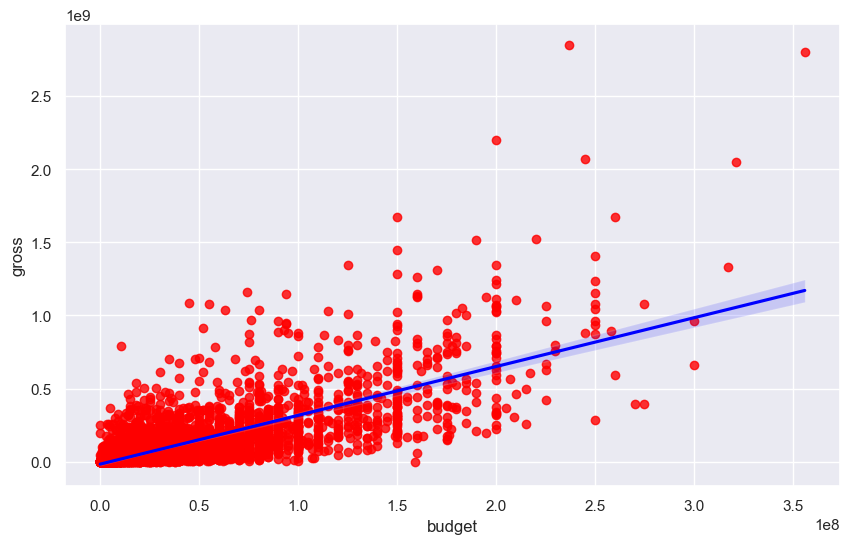

In [126]:
fig = plt.figure(figsize = (10, 6))
sns.regplot(x=movies['budget'], y=movies['gross'], scatter_kws={"color":"red"}, line_kws={"color":"blue"})


#### From this regression plot we can see for certain that there is high correlation between budget and gross earnings

In [107]:
#chcking for correlation
movies.corr(method='pearson')

C:\Users\Olasunkanmi Dara\AppData\Local\Temp\ipykernel_15700\2789189174.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  movies.corr(method='pearson')


,year,score,votes,budget,gross,runtime
year,1.000000,0.056386,0.206021,0.327722,0.274321,0.075077
score,0.056386,1.000000,0.474256,0.072001,0.222556,0.414068
votes,0.206021,0.474256,1.000000,0.439675,0.614751,0.352303
budget,0.327722,0.072001,0.439675,1.000000,0.740247,0.318695
gross,0.274321,0.222556,0.614751,0.740247,1.000000,0.275796
runtime,0.075077,0.414068,0.352303,0.318695,0.275796,1.000000


C:\Users\Olasunkanmi Dara\AppData\Local\Temp\ipykernel_15700\2249293346.py:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = movies.corr(method='pearson')


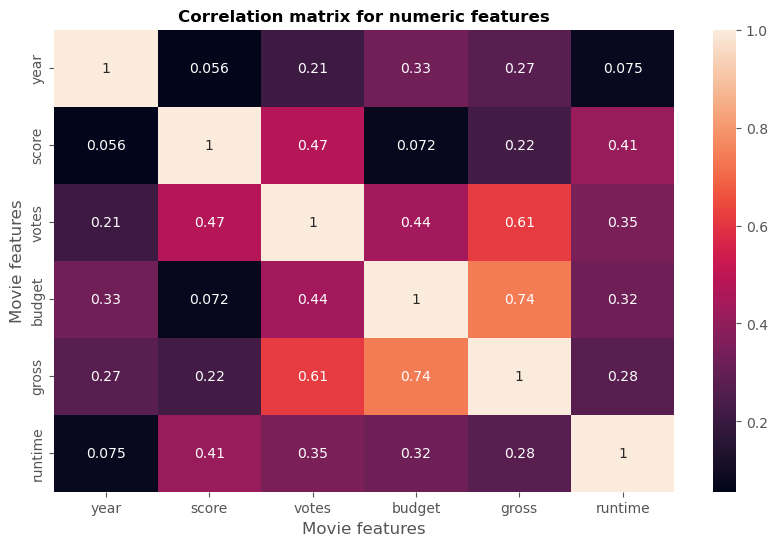

In [115]:
#chcking the correlation of the numerical columns using heatmap
fig = plt.figure(figsize = (10, 6))
corr_matrix = movies.corr(method='pearson')
sns.heatmap(corr_matrix, annot=True)

plt.xlabel('Movie features')
plt.ylabel('Movie features')
plt.title('Correlation matrix for numeric features', fontsize = 12, weight = 'bold')

#display map
plt.show()

In [145]:
#making all objects type columns in categorical  form to enable us check for  correlation
movies_categorized = movies
#for loop
for col in movies_categorized.columns:
    if(movies_categorized[col].dtype == 'object'):
       movies_categorized[col] = movies_categorized[col].astype('category')
       movies_categorized[col] = movies_categorized[col].cat.codes
 #catcodes to assign unique code for each value in the column

movies_categorized        

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,correctyear
5445,386,5,0,2009,2009-12-18,7.8,1100000.0,785,1263,1534,47,237000000,2847246203,1382,162.0,29
7445,388,5,0,2019,2019-04-26,8.4,903000.0,105,513,1470,47,356000000,2797501328,983,181.0,39
3045,4909,5,6,1997,1997-12-19,7.8,1100000.0,785,1263,1073,47,200000000,2201647264,1382,194.0,17
6663,3643,5,0,2015,2015-12-18,7.8,876000.0,768,1806,356,47,245000000,2069521700,945,138.0,35
7244,389,5,0,2018,2018-04-27,8.4,897000.0,105,513,1470,47,321000000,2048359754,983,149.0,38
7480,4388,4,2,2019,2019-07-19,6.9,222000.0,1012,1361,457,47,260000000,1670727580,1423,118.0,39
6653,2117,5,0,2015,2015-06-12,7.0,593000.0,335,2523,293,47,150000000,1670516444,1397,124.0,35
6043,3878,5,0,2012,2012-05-04,8.0,1300000.0,1060,1646,1470,47,220000000,1518815515,983,143.0,32
6646,1541,5,0,2015,2015-04-03,7.1,370000.0,809,481,1785,47,190000000,1515341399,1397,137.0,35
7494,1530,4,2,2019,2019-11-22,6.8,148000.0,277,1383,1036,47,150000000,1450026933,1422,103.0,39


In [85]:
movies

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,correctyear
7445,Avengers: Endgame,PG-13,Action,2019,2019-04-26,8.4,903000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181.0,2019
7244,Avengers: Infinity War,PG-13,Action,2018,2018-04-27,8.4,897000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.0,2018
7075,Star Wars: Episode VIII - The Last Jedi,PG-13,Action,2017,2017-12-15,7.0,581000.0,Rian Johnson,Rian Johnson,Daisy Ridley,United States,317000000,1332698830,Walt Disney Pictures,152.0,2017
7066,Justice League,PG-13,Action,2017,2017-11-17,6.1,418000.0,Zack Snyder,Jerry Siegel,Ben Affleck,United States,300000000,657926987,Warner Bros.,120.0,2017
5060,Pirates of the Caribbean: at World's End,PG-13,Action,2007,2007-05-25,7.1,608000.0,Gore Verbinski,Ted Elliott,Johnny Depp,United States,300000000,960996492,Walt Disney Pictures,169.0,2007
7261,Solo: A Star Wars Story,PG-13,Action,2018,2018-05-25,6.9,306000.0,Ron Howard,Jonathan Kasdan,Alden Ehrenreich,United States,275000000,392924807,Lucasfilm,135.0,2018
7463,Star Wars: Episode IX - The Rise of Skywalker,PG-13,Action,2019,2019-12-20,6.5,394000.0,J.J. Abrams,Chris Terrio,Daisy Ridley,United States,275000000,1078232589,Walt Disney Pictures,141.0,2019
4870,Superman Returns,PG-13,Action,2006,2006-06-28,6.0,274000.0,Bryan Singer,Michael Dougherty,Brandon Routh,United States,270000000,391081192,Warner Bros.,154.0,2006
7480,The Lion King,PG,Animation,2019,2019-07-19,6.9,222000.0,Jon Favreau,Jeff Nathanson,Donald Glover,United States,260000000,1670727580,Walt Disney Pictures,118.0,2019
5658,Tangled,PG,Animation,2010,2010-11-24,7.7,417000.0,Nathan Greno,Dan Fogelman,Mandy Moore,United States,260000000,592462816,Walt Disney Animation Studios,100.0,2010


C:\Users\Olasunkanmi Dara\AppData\Local\Temp\ipykernel_15700\630053775.py:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = movies_categorized.corr(method='pearson')


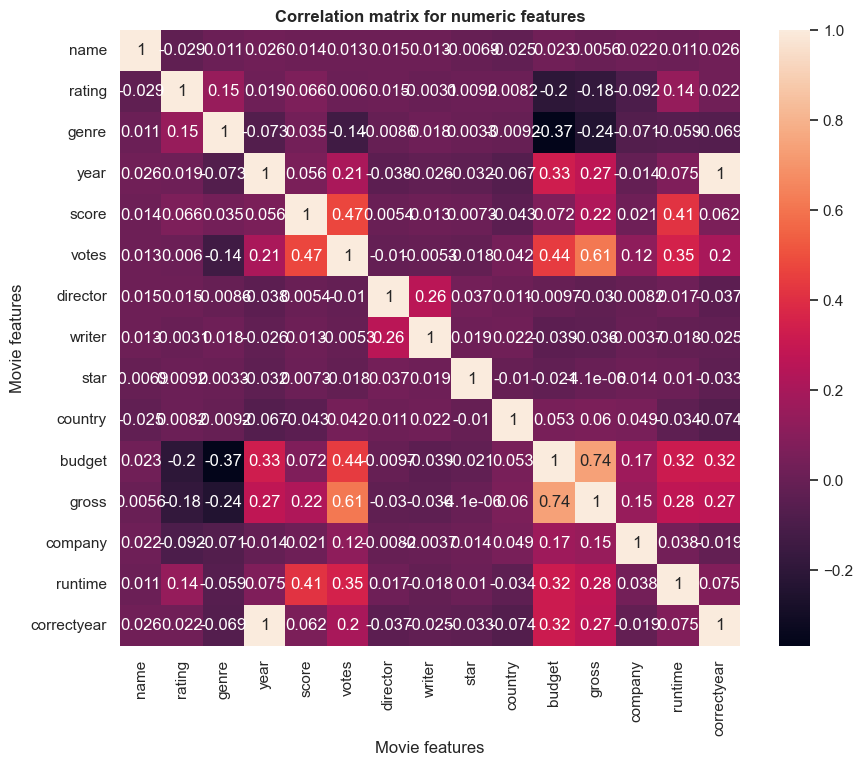

In [147]:
# checking the correlation matrix aftetr including all of it
fig = plt.figure(figsize = (10, 8))
corr_matrix = movies_categorized.corr(method='pearson')
sns.heatmap(corr_matrix, annot=True)

plt.xlabel('Movie features')
plt.ylabel('Movie features')
plt.title('Correlation matrix for numeric features', fontsize = 12, weight = 'bold')

#display map
plt.show()

#### The correclation is bigger and clearer to see

In [149]:
movies_categorized.corr()

C:\Users\Olasunkanmi Dara\AppData\Local\Temp\ipykernel_15700\2429187169.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  movies_categorized.corr()


,name,rating,genre,year,score,votes,director,writer,star,country,budget,gross,company,runtime,correctyear
name,1.000000,-0.029234,0.010996,0.025542,0.014450,0.012615,0.015246,0.012880,-0.006882,-0.025490,0.023392,0.005639,0.021697,0.010850,0.025542
rating,-0.029234,1.000000,0.147796,0.019499,0.065983,0.006031,0.014656,-0.003149,0.009196,0.008230,-0.203946,-0.181906,-0.092357,0.140792,0.022021
genre,0.010996,0.147796,1.000000,-0.073167,0.035106,-0.135990,-0.008553,0.017578,0.003341,-0.009164,-0.368523,-0.244101,-0.071334,-0.059237,-0.069147
year,0.025542,0.019499,-0.073167,1.000000,0.056386,0.206021,-0.038354,-0.025908,-0.032157,-0.066748,0.327722,0.274321,-0.014333,0.075077,0.998726
score,0.014450,0.065983,0.035106,0.056386,1.000000,0.474256,0.005413,0.012843,0.007296,-0.043051,0.072001,0.222556,0.020656,0.414068,0.061923
votes,0.012615,0.006031,-0.135990,0.206021,0.474256,1.000000,-0.010376,-0.005316,-0.017638,0.041551,0.439675,0.614751,0.118470,0.352303,0.203098
director,0.015246,0.014656,-0.008553,-0.038354,0.005413,-0.010376,1.000000,0.261735,0.036593,0.011133,-0.009662,-0.029560,-0.008223,0.017433,-0.037371
writer,0.012880,-0.003149,0.017578,-0.025908,0.012843,-0.005316,0.261735,1.000000,0.018520,0.022488,-0.039466,-0.035885,-0.003697,-0.017561,-0.025495
star,-0.006882,0.009196,0.003341,-0.032157,0.007296,-0.017638,0.036593,0.018520,1.000000,-0.009990,-0.021473,-0.000004,0.014082,0.010108,-0.032687
country,-0.025490,0.008230,-0.009164,-0.066748,-0.043051,0.041551,0.011133,0.022488,-0.009990,1.000000,0.052977,0.060078,0.048569,-0.034477,-0.073569


In [151]:
# reshaping from row index to coolumn in dex using unstack
correlation_matrix = movies_categorized.corr()

corr_pairs = correlation_matrix.unstack()
corr_pairs #display

C:\Users\Olasunkanmi Dara\AppData\Local\Temp\ipykernel_15700\3268577426.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = movies_categorized.corr()


name         name           1.000000
             rating        -0.029234
             genre          0.010996
             year           0.025542
             score          0.014450
             votes          0.012615
             director       0.015246
             writer         0.012880
             star          -0.006882
             country       -0.025490
             budget         0.023392
             gross          0.005639
             company        0.021697
             runtime        0.010850
             correctyear    0.025542
rating       name          -0.029234
             rating         1.000000
             genre          0.147796
             year           0.019499
             score          0.065983
             votes          0.006031
             director       0.014656
             writer        -0.003149
             star           0.009196
             country        0.008230
             budget        -0.203946
             gross         -0.181906
 

In [152]:
#sort out the corr pairs
sorted_pairs = corr_pairs.sort_values()
#display
sorted_pairs

genre        budget        -0.368523
budget       genre         -0.368523
gross        genre         -0.244101
genre        gross         -0.244101
rating       budget        -0.203946
budget       rating        -0.203946
gross        rating        -0.181906
rating       gross         -0.181906
genre        votes         -0.135990
votes        genre         -0.135990
rating       company       -0.092357
company      rating        -0.092357
country      correctyear   -0.073569
correctyear  country       -0.073569
year         genre         -0.073167
genre        year          -0.073167
             company       -0.071334
company      genre         -0.071334
genre        correctyear   -0.069147
correctyear  genre         -0.069147
year         country       -0.066748
country      year          -0.066748
runtime      genre         -0.059237
genre        runtime       -0.059237
country      score         -0.043051
score        country       -0.043051
budget       writer        -0.039466
w

In [153]:
#if correlation is greater than 0.5 categorized as  high corr
high_corr = sorted_pairs[(sorted_pairs) > 0.5]
#view columns with high corr
high_corr

gross        votes          0.614751
votes        gross          0.614751
gross        budget         0.740247
budget       gross          0.740247
year         correctyear    0.998726
correctyear  year           0.998726
name         name           1.000000
writer       writer         1.000000
company      company        1.000000
gross        gross          1.000000
budget       budget         1.000000
country      country        1.000000
star         star           1.000000
director     director       1.000000
votes        votes          1.000000
score        score          1.000000
year         year           1.000000
genre        genre          1.000000
rating       rating         1.000000
runtime      runtime        1.000000
correctyear  correctyear    1.000000
dtype: float64

#### We can see that votes and budget have the highest correlation to gross earnings but the company has a low correlation to the gross earnings 